# 4.0 Modeling
The purpose of this notebook is to investigate our proposed clustering models for our data including a basic KMeans model, a model that will interpret the data using a large language model before passing it to a KMeans model, and a KPrototypes model and select a model to cluster our data with.

In [113]:
import pandas as pd

import importlib
import sys

# setting path
sys.path.append('..')
# importing
from src.models import modeling
importlib.reload(modeling);

## 1. Load Data

In [114]:
kmeans_all = pd.read_csv('../data/processed/kmeans_all_data.csv')
kmeans_high = pd.read_csv('../data/processed/kmeans_high_school.csv')

llm_all = pd.read_csv('../data/processed/llm_kmeans_all_data.csv')
llm_high = pd.read_csv('../data/processed/llm_kmeans_high_school.csv')

kprototypes_all = pd.read_csv('../data/processed/no_outliers_kmeans_all_data.csv')
kprototypes_high = pd.read_csv('../data/processed/no_outliers_kmeans_high_school.csv')

## 2. Choosing the Right K
In this section, we will look at elbow plots and silhoutte scores for different values of k across each model

In [116]:
# KMeans
kmeans_all_modeler = modeling.KMeansSelector(kmeans_all)
kmeans_high_modeler = modeling.KMeansSelector(kmeans_high)
# LLM
llm_all_modeler = modeling.KMeansSelector(llm_all)
llm_high_modeler = modeling.KMeansSelector(llm_high)
# Kprototypes
kpro_all_selector = modeling.KPrototypesModelSelector(kprototypes_all)
kpro_high_selector = modeling.KPrototypesModelSelector(kprototypes_high)

### 2.1 KMeans

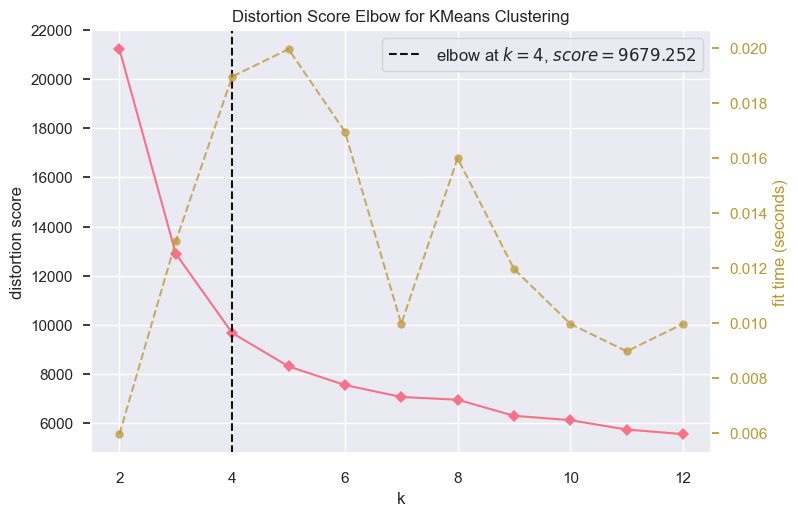

In [10]:
kmeans_all_modeler.show_elbow()

k=2
For n_clusters=2 The average silhouette score is 0.4931907064452068


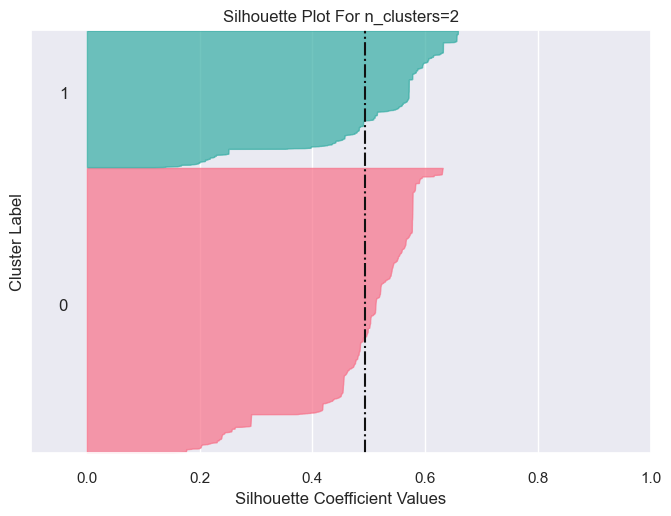

k=3
For n_clusters=3 The average silhouette score is 0.48585969955438163


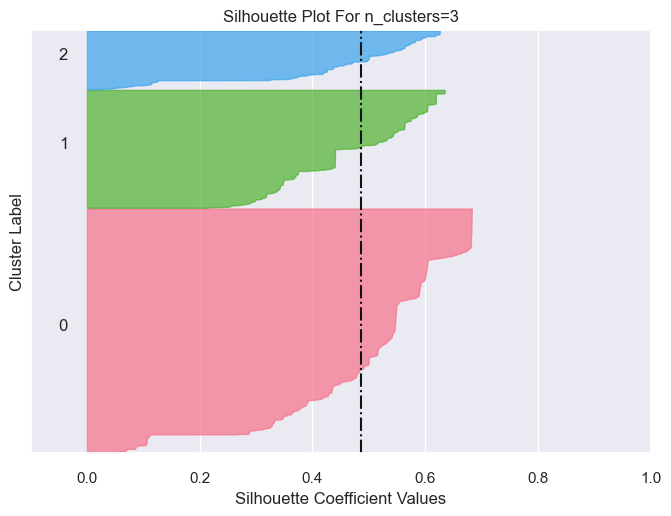

k=4
For n_clusters=4 The average silhouette score is 0.46608928320110987


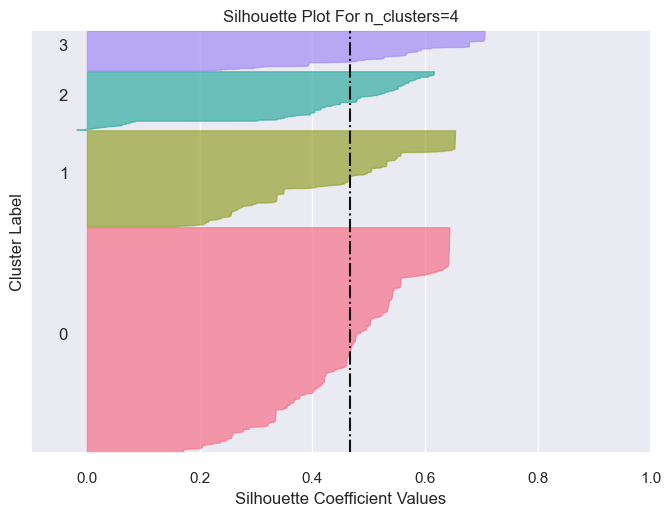

k=5
For n_clusters=5 The average silhouette score is 0.3569195992566749


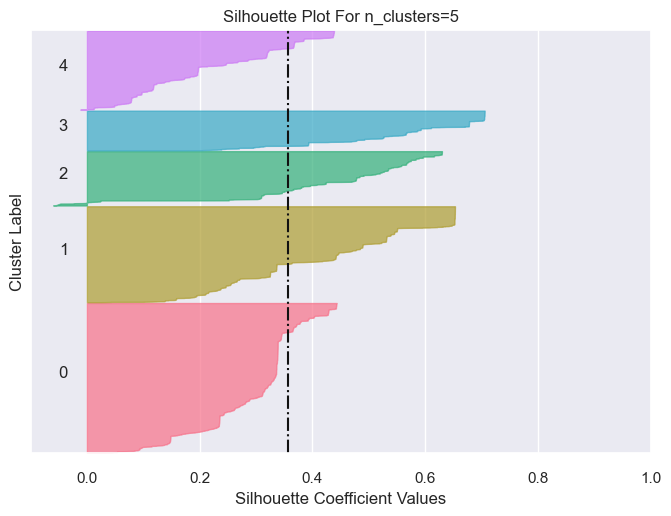

k=6
For n_clusters=6 The average silhouette score is 0.3420915849728551


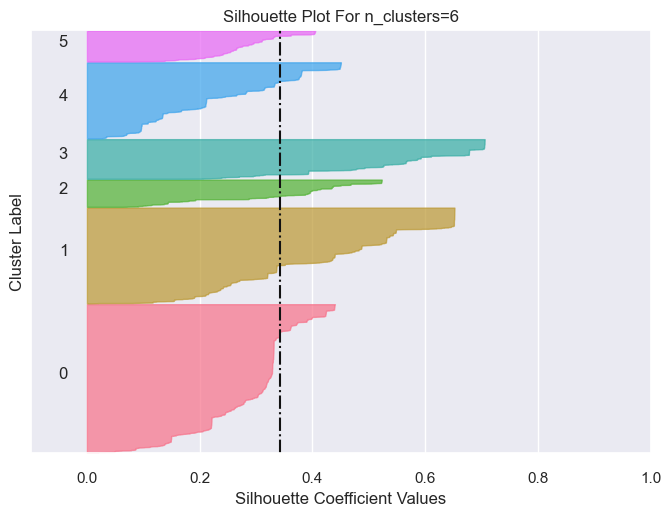

In [11]:
kmeans_all_modeler.show_silhouettes(2,7)

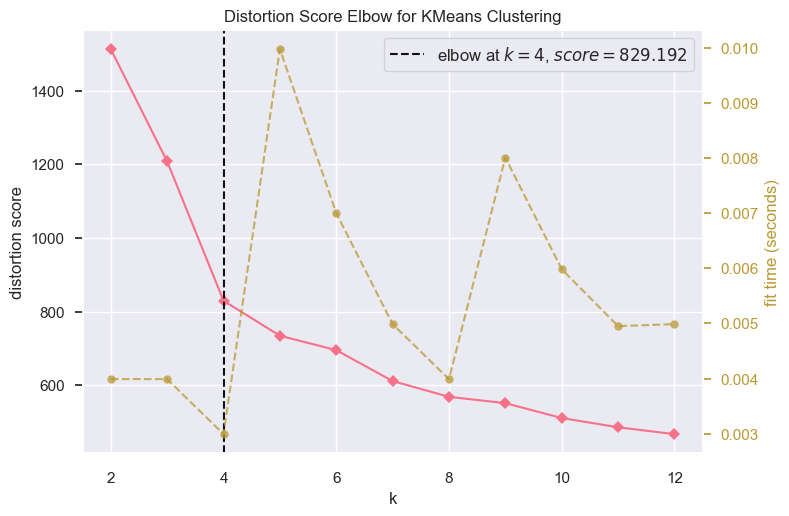

In [12]:
kmeans_high_modeler.show_elbow()

k=2
For n_clusters=2 The average silhouette score is 0.49584728026884367


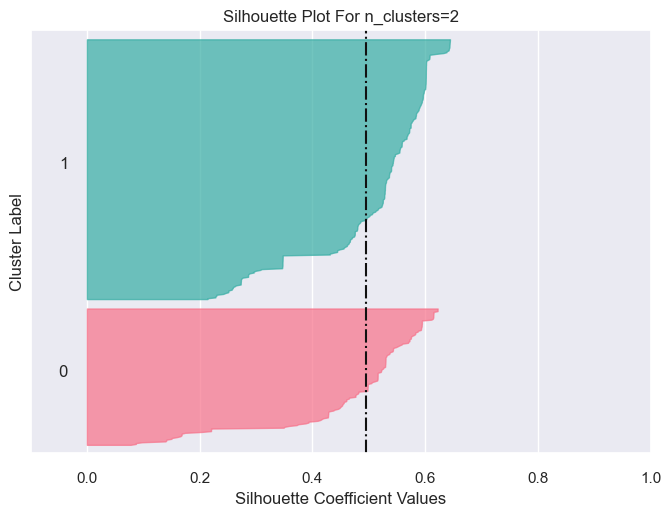

k=3
For n_clusters=3 The average silhouette score is 0.3504004259495459


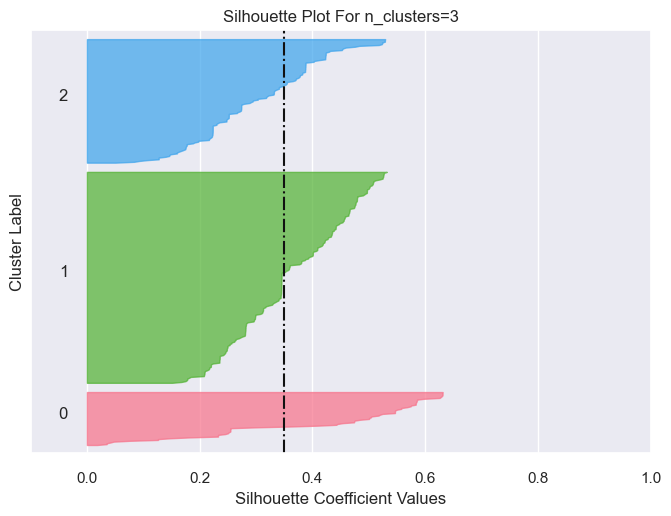

k=4
For n_clusters=4 The average silhouette score is 0.4272400246241571


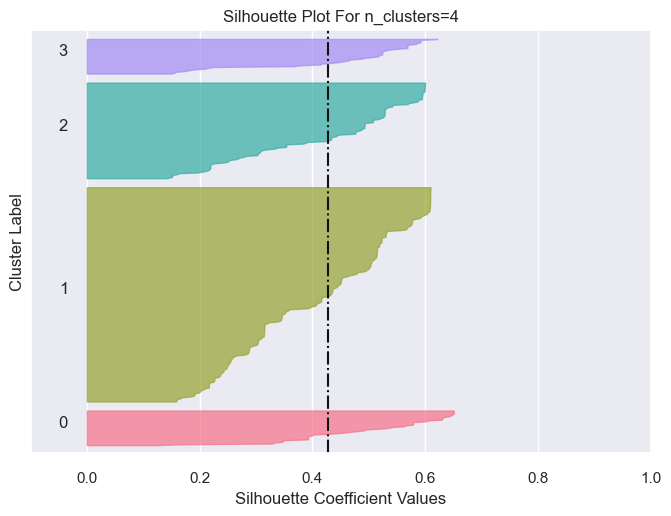

k=5
For n_clusters=5 The average silhouette score is 0.3039742874245962


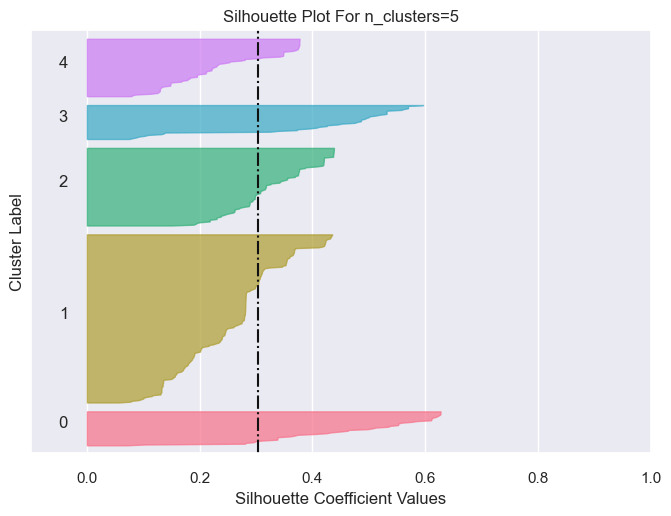

k=6
For n_clusters=6 The average silhouette score is 0.2858837251954019


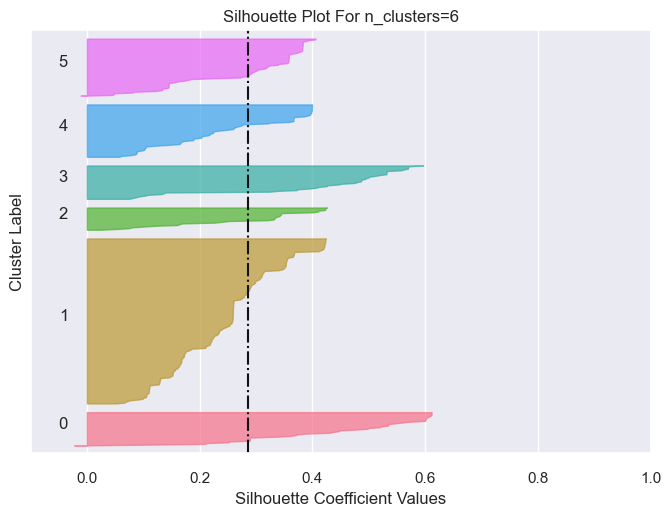

In [13]:
kmeans_high_modeler.show_silhouettes(2,7)

We can confidently conclude that a value of 4 for both the all data and the high school data is a good choice for k. At this value, we can see an elbow in the distortion and silhouette scores as well as fairly even class distribution among assigned labels

### 2.2 LLM + KMeans

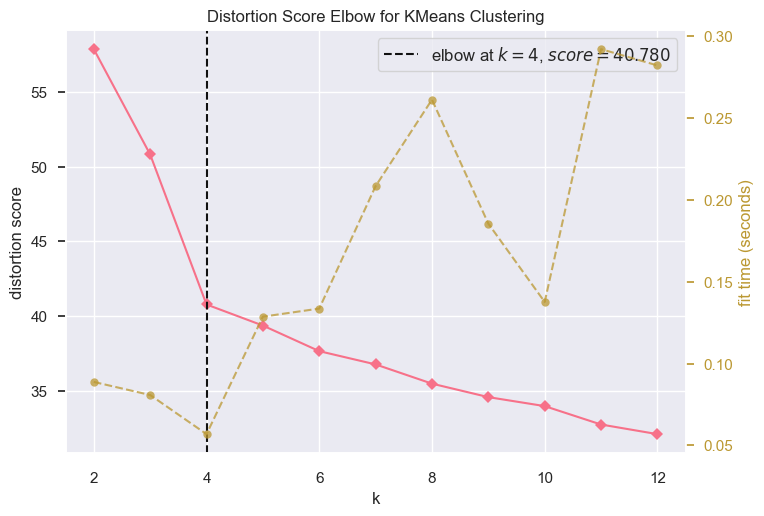

In [14]:
llm_all_modeler.show_elbow()

k=2
For n_clusters=2 The average silhouette score is 0.323892622223906


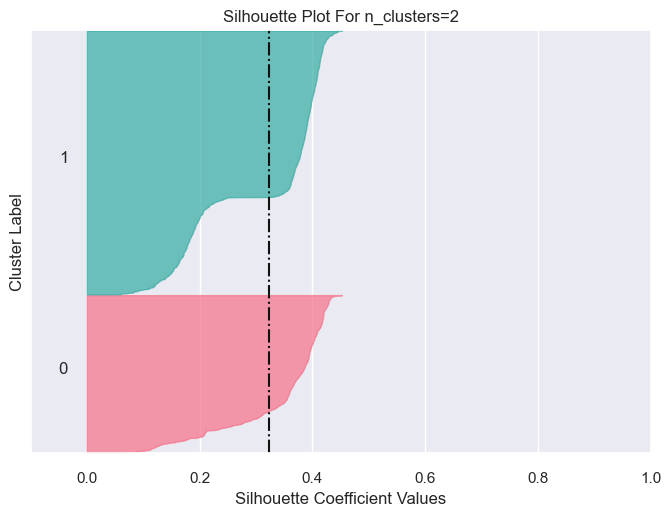

k=3
For n_clusters=3 The average silhouette score is 0.33315047953209925


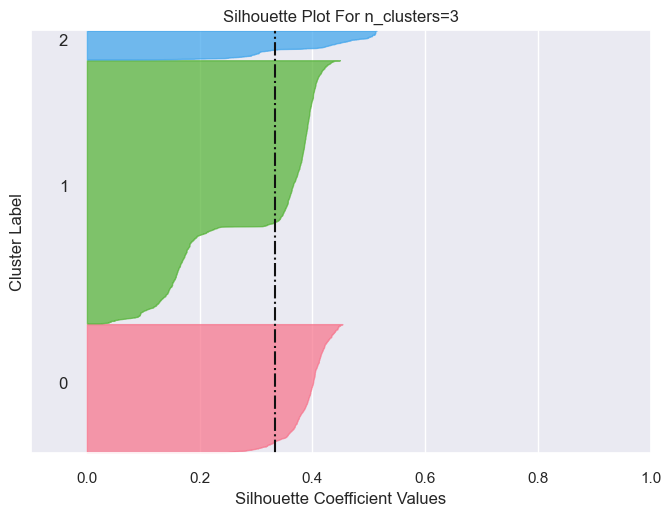

k=4
For n_clusters=4 The average silhouette score is 0.291112588123498


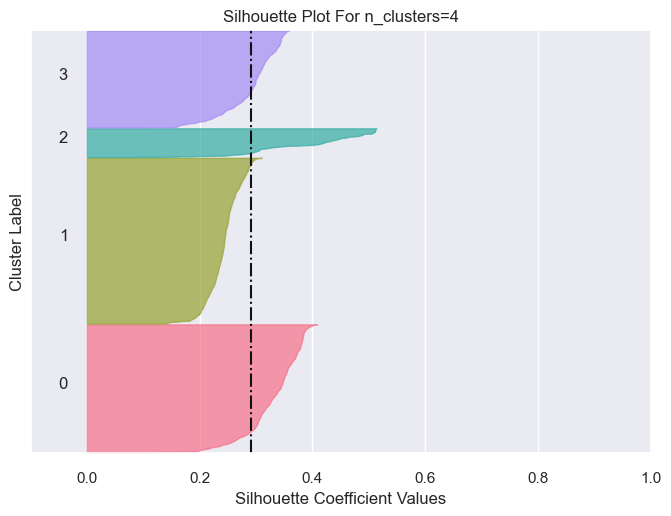

k=5
For n_clusters=5 The average silhouette score is 0.2264327756655076


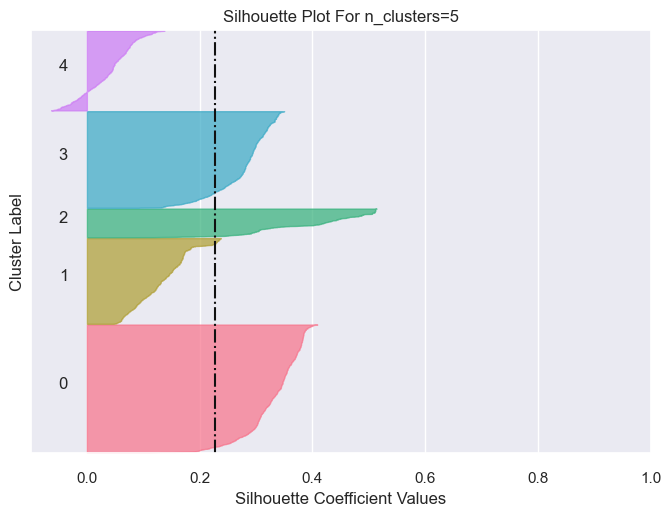

k=6
For n_clusters=6 The average silhouette score is 0.24535319438152445


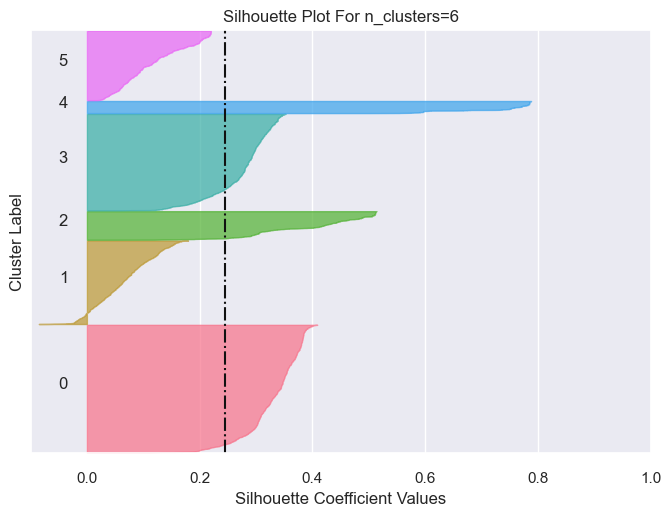

In [15]:
llm_all_modeler.show_silhouettes(2,7)

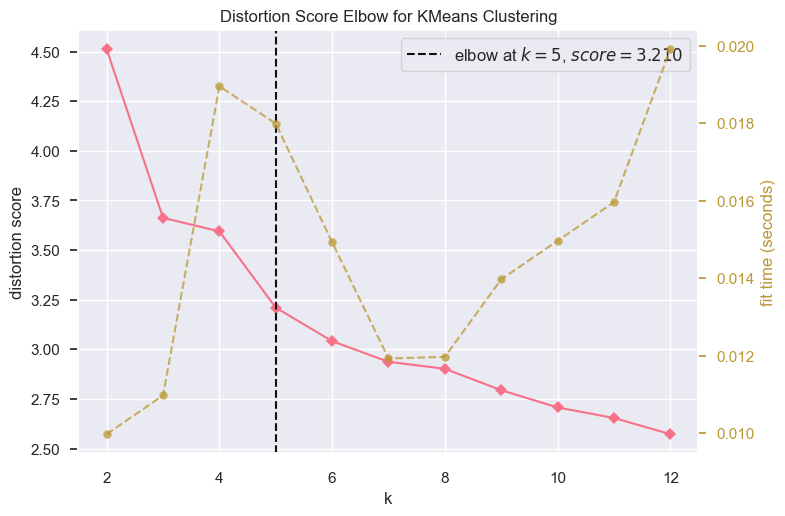

In [16]:
llm_high_modeler.show_elbow()

k=2
For n_clusters=2 The average silhouette score is 0.33552239011025536


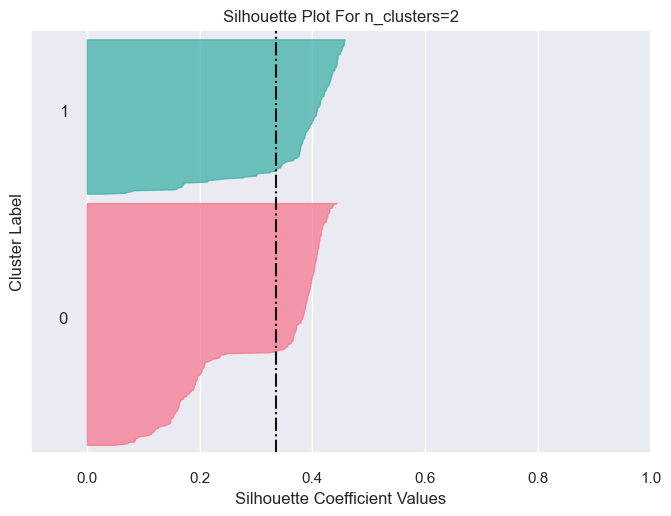

k=3
For n_clusters=3 The average silhouette score is 0.26771241504988624


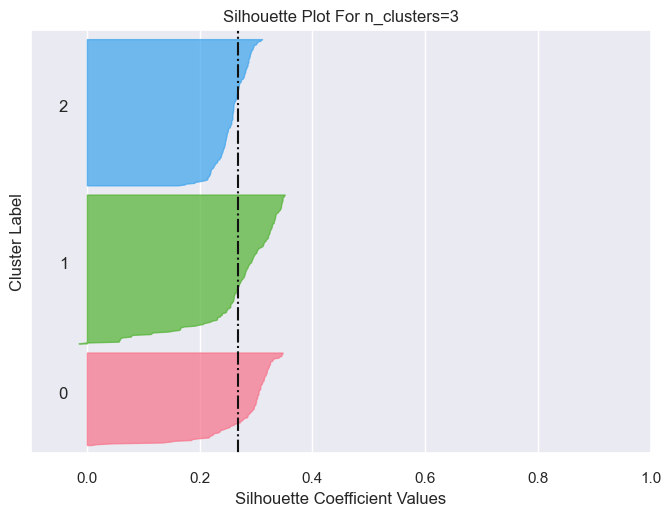

k=4
For n_clusters=4 The average silhouette score is 0.21697032379660516


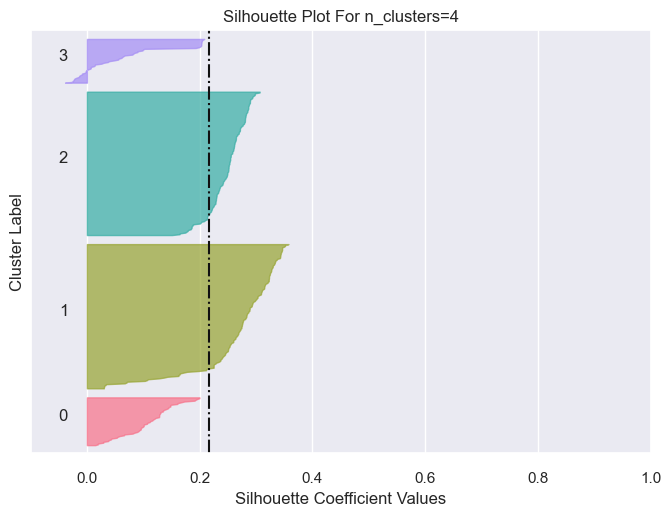

k=5
For n_clusters=5 The average silhouette score is 0.2404563365257746


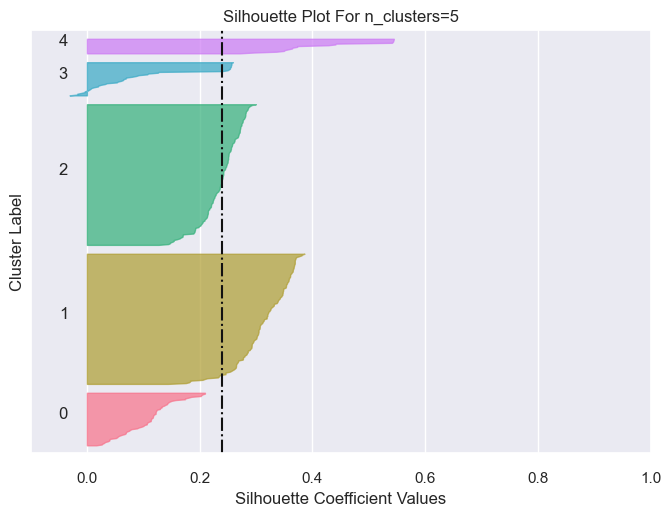

k=6
For n_clusters=6 The average silhouette score is 0.22786020186972944


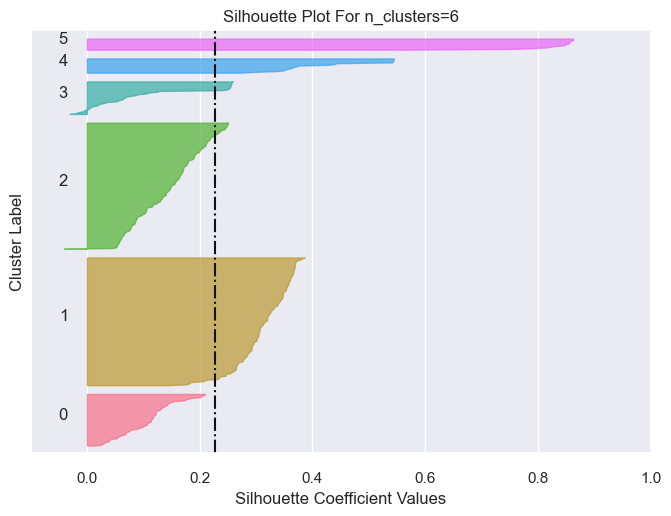

In [18]:
llm_high_modeler.show_silhouettes(2,7)

Similar to the simple KMeans model, $k = 4$ is suggested for the all_data model. However, for the high school dataset, we observe something different. The elbow plot recommends $k = 5$, but from the silhouette plots, we see negative silhouettes at $k >= 4$ in addition to highly imbalanced class sizes. Therefore we have determine that $k = 3$ is the best choice for this model

### 2.3 KPrototypes
Using the KPrototypes model implemented by KModes, we will look at its elbow plots

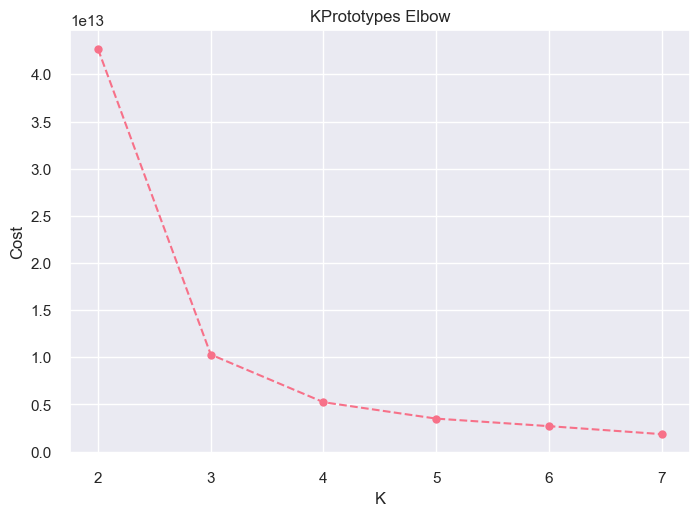

In [19]:
kpro_all_selector.show_elbow()

k=2
For n_clusters=2 The average silhouette score is 0.2119830846786499


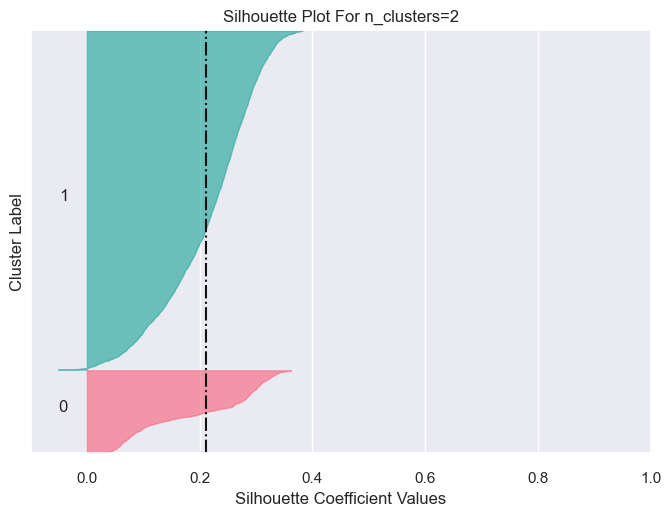

k=3
For n_clusters=3 The average silhouette score is 0.09716799855232239


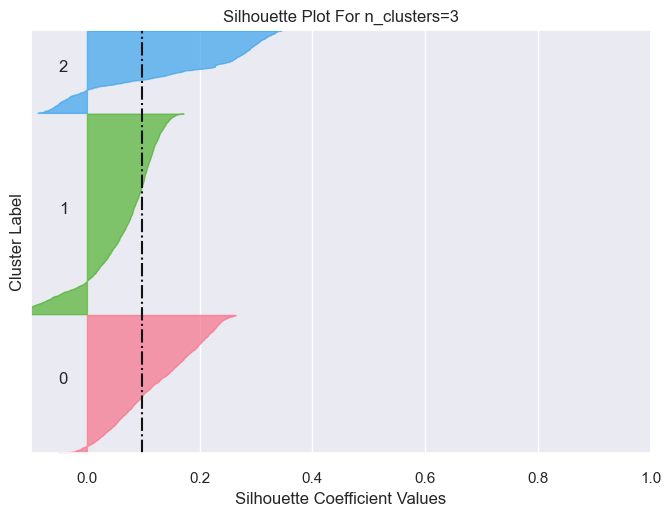

k=4
For n_clusters=4 The average silhouette score is 0.07459080964326859


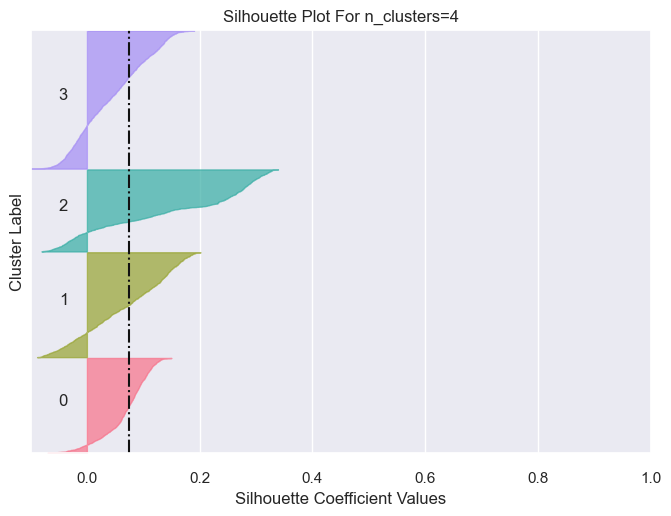

k=5
For n_clusters=5 The average silhouette score is 0.05434860289096832


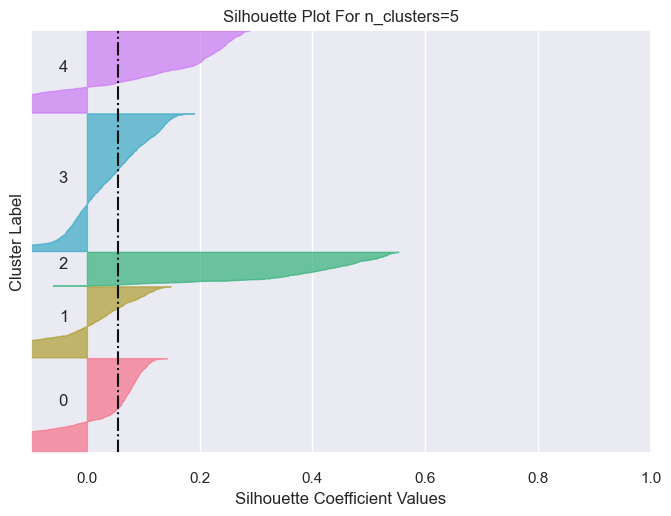

k=6
For n_clusters=6 The average silhouette score is 0.022048242390155792


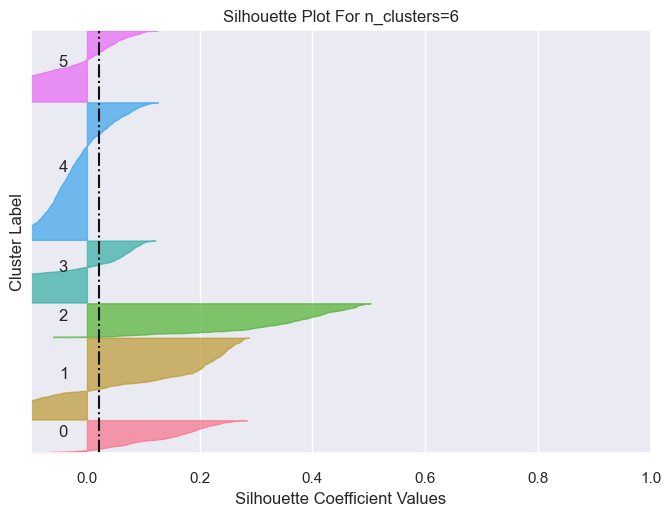

In [117]:
kpro_all_selector.show_silhouettes(2,7)

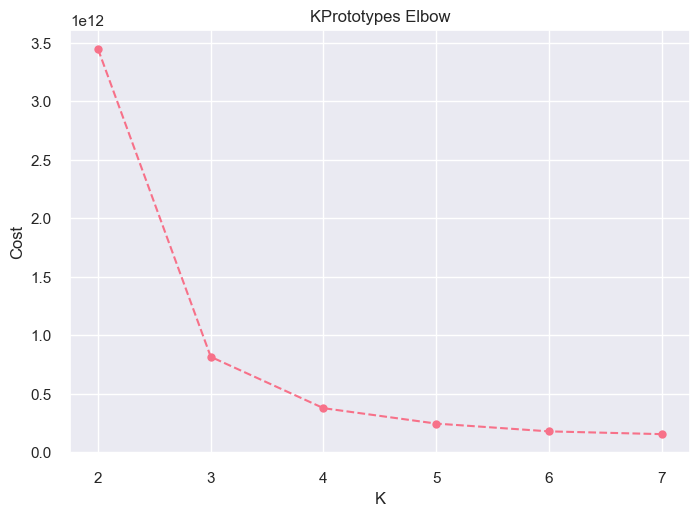

In [20]:
kpro_high_selector.show_elbow()

k=2
For n_clusters=2 The average silhouette score is 0.1868474930524826


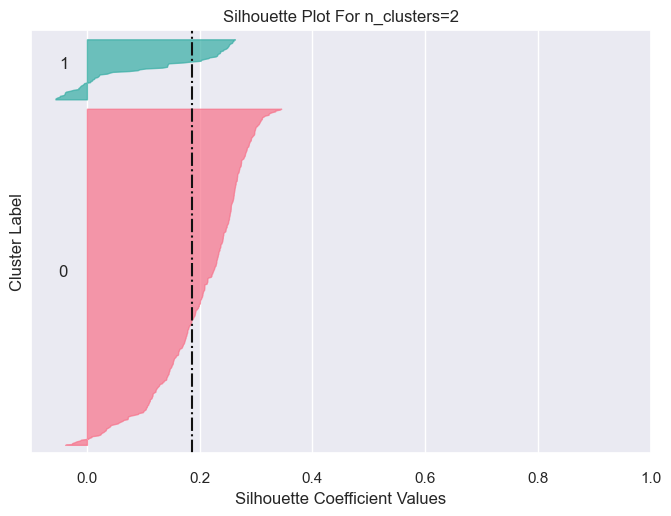

k=3
For n_clusters=3 The average silhouette score is 0.08140871673822403


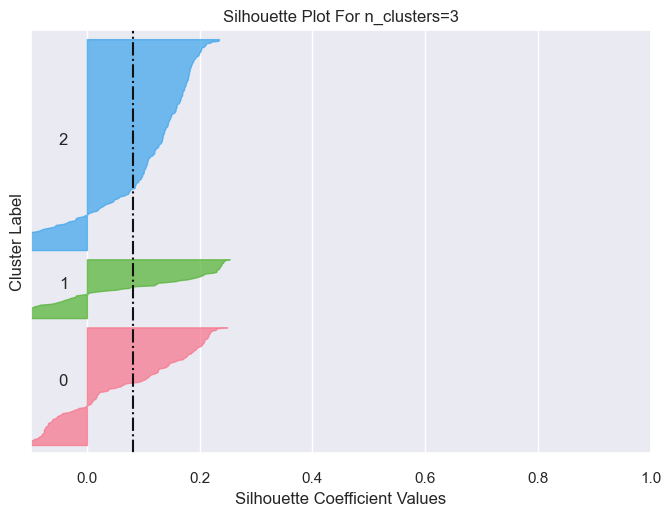

k=4
For n_clusters=4 The average silhouette score is 0.041308749467134476


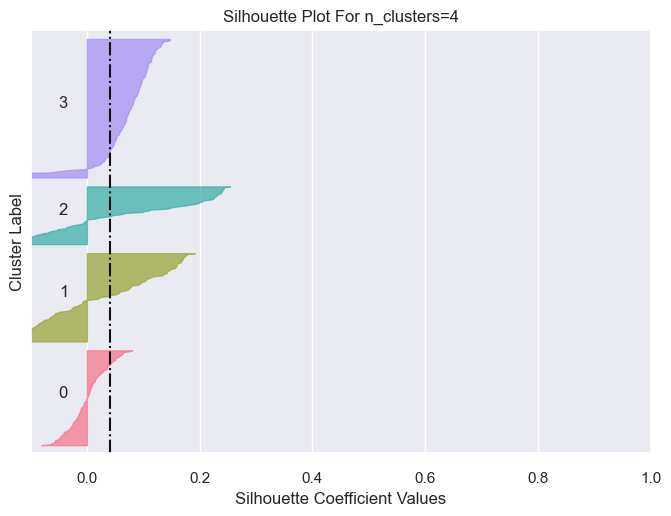

k=5
For n_clusters=5 The average silhouette score is 0.021531684324145317


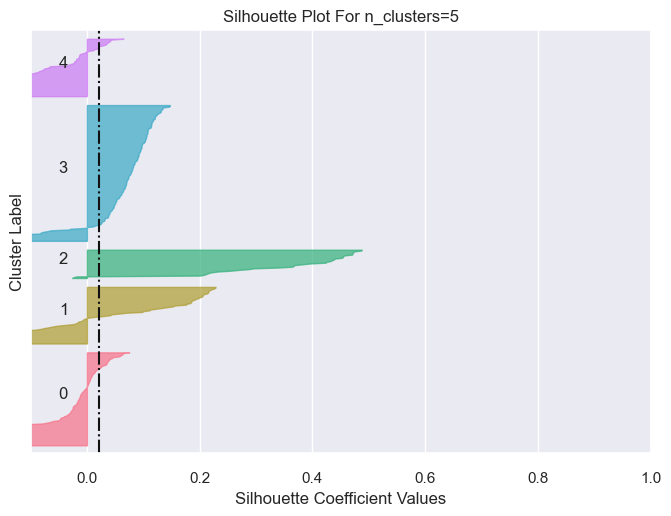

In [118]:
kpro_high_selector.show_silhouettes(2, 6)

The Kprototypes models are in agreement with the KMeans models that $k=4$ is the best choice

## 3. Evaluating Models

In [124]:
# Load Models
# KMeans
all_model = modeling.KMeansModel(kmeans_all, 4)
high_model = modeling.KMeansModel(kmeans_high, 3)
# LLM KMeans
llm_all_model = modeling.KMeansModel(llm_all, 4)
llm_high_model = modeling.KMeansModel(llm_high, 3)
llm_all_no_outliers = pd.read_csv('../data/processed/no_outliers_llm_kmeans_all_data.csv')
llm_high_no_outliers = pd.read_csv('../data/processed/no_outliers_llm_kmeans_high_school.csv')
# KPrototypes
kpro_all_model = modeling.KPrototypesModel(kprototypes_all, 4)
kpro_high_model = modeling.KPrototypesModel(kprototypes_high, 3)

# Fit and Predict
# KMeans
all_model.fit_predict()
high_model.fit_predict()
# LLM KMeans
llm_all_model.fit_predict()
llm_high_model.fit_predict()
# KPrototypes
kpro_all_model.fit_predict()
kpro_high_model.fit_predict()

### 3.1 Metrics

#### A. KMeans

In [125]:
all_model.evaluate_model()

Davies Bouldin Score: 0.7367555589700681
Calinksi Score: 7169.814226910936
Silhouette Score: 0.46608928320110987


In [126]:
high_model.evaluate_model()

Davies Bouldin Score: 0.9369930367816698
Calinksi Score: 442.7805362219035
Silhouette Score: 0.3504004259495459


#### B. LLM + KMeans

In [127]:
llm_all_model.evaluate_model()

Davies Bouldin Score: 1.3631899249798807
Calinksi Score: 2204.9442681128
Silhouette Score: 0.291112588123498


In [128]:
llm_high_model.evaluate_model()

Davies Bouldin Score: 1.4823347709653714
Calinksi Score: 227.05871750502533
Silhouette Score: 0.26771241504988624


Based solely on metrics the KMeans model seems to outperform the LLM + KMeans model.

In [129]:
model_names = ('KMeans', 'LLM', 'KPrototypes')
all_models = (all_model, llm_all_model, kpro_all_model)
high_models = (high_model, llm_high_model, kpro_high_model)

In [130]:
modeling.show_adj_rand_score_mat(all_models, model_names)

,KMeans,LLM,KPrototypes
KMeans,1.000000,0.000000,0.0
LLM,-0.000790,1.000000,0.0
KPrototypes,-0.033713,0.023775,1.0


In [131]:
modeling.show_adj_rand_score_mat(high_models, model_names)

,KMeans,LLM,KPrototypes
KMeans,1.000000,0.000000,0.0
LLM,0.003163,1.000000,0.0
KPrototypes,0.140891,0.000651,1.0


According to the adjusted rand score, we can see that each model chooses a unique clustering of the data with the most similar being between the KMeans and KPrototypes models of the high school dataset 

### 3.2 Feature Importances
In this section, we will use a LGBM classifier to classify the clusters using the original dataset in order to determine the relative feature importances necessary for that classification

#### A. KMeans

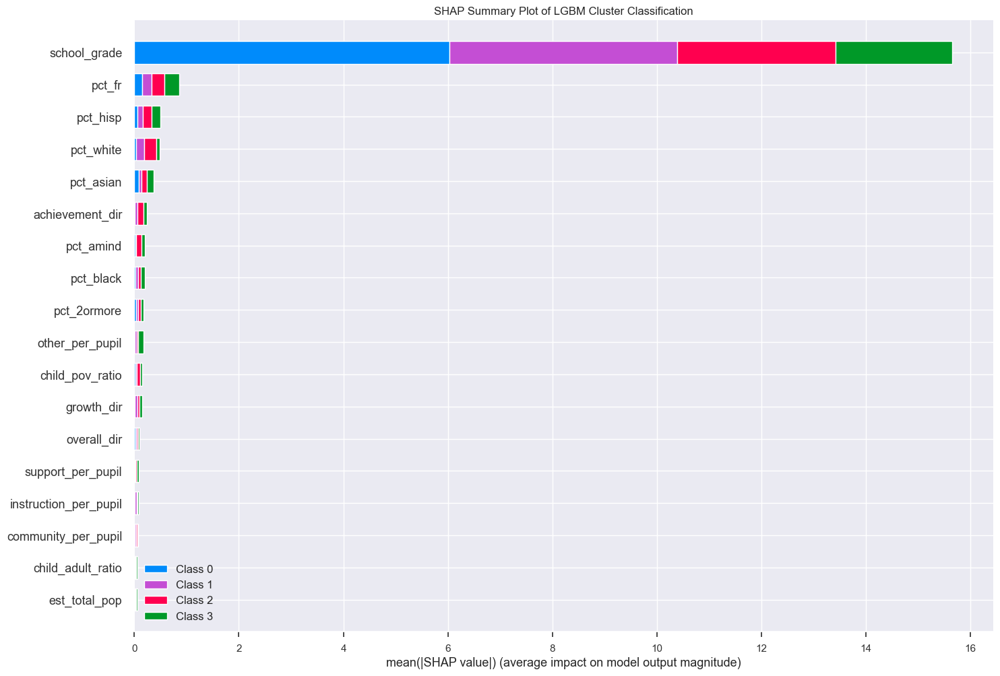

In [27]:
all_model.show_feature_importance()

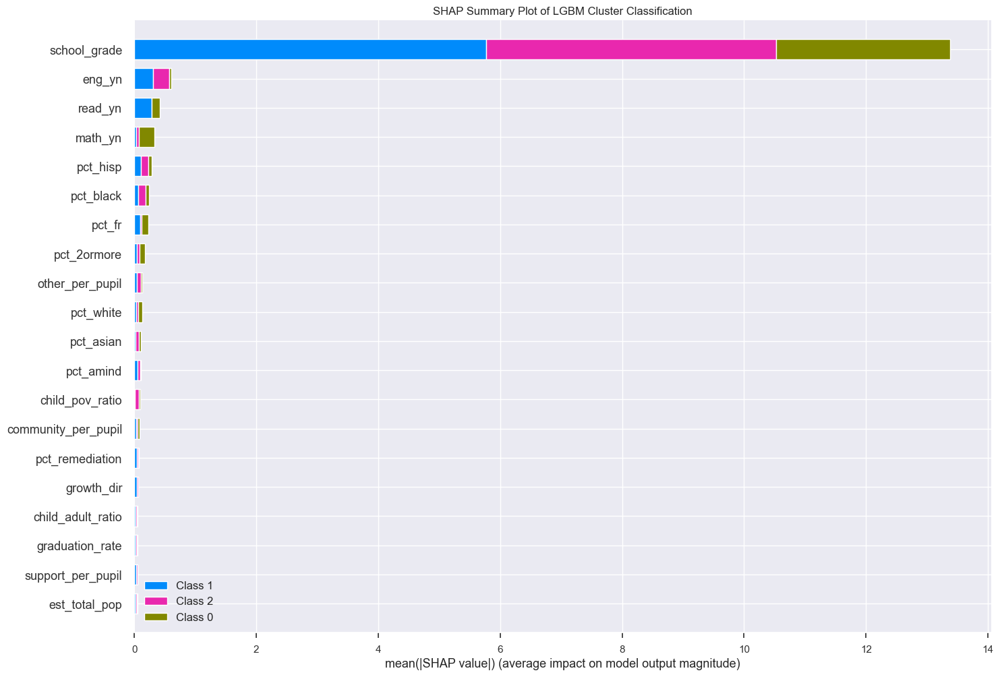

In [132]:
high_model.show_feature_importance()

It seems like the simple KMeans model is only making class distinctions based off of school grade. There is not any deeper analaysis into what is going on

#### B. LLM + KMeans

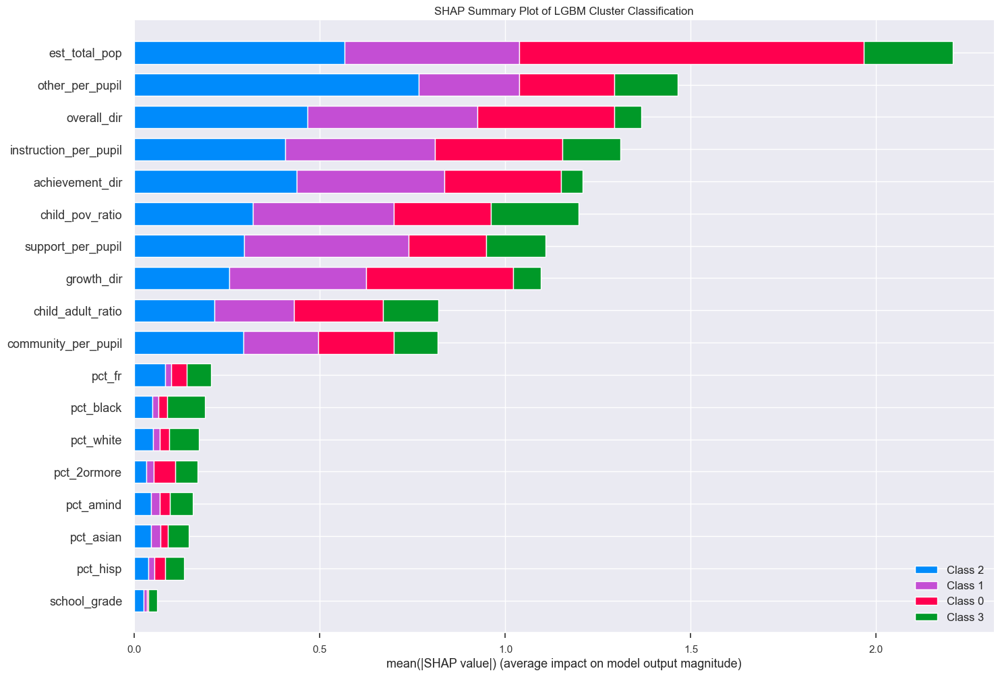

In [29]:
llm_all_model.show_feature_importance(llm_all_no_outliers.drop(['unique_id', 'year'], axis=1))

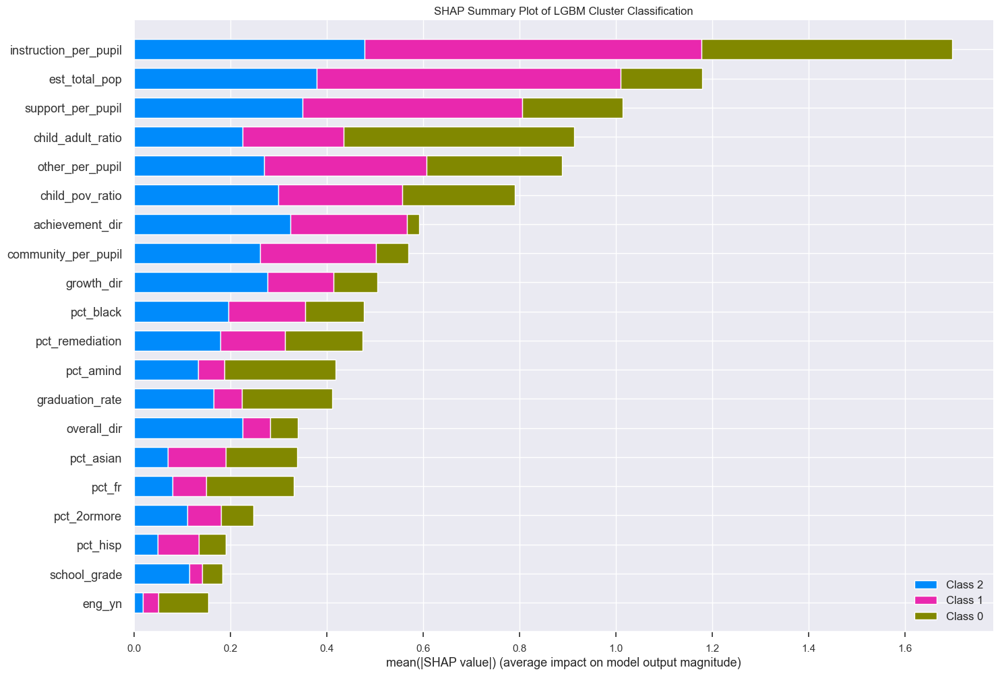

In [36]:
llm_high_model.show_feature_importance(llm_high_no_outliers.drop(['unique_id', 'year'], axis=1))

The LLM + KMeans models take more features into consideration where school_grade is actually one of the least important features. The model also seems to consider numerical and categorical features equally.

#### C. Kprototypes

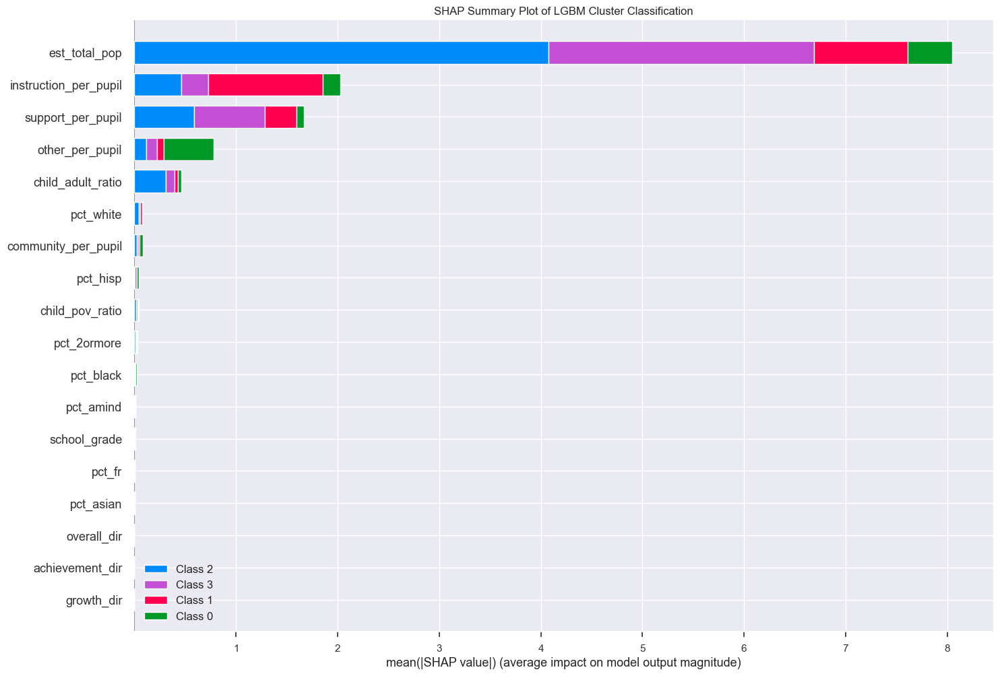

In [43]:
kpro_all_model.show_feature_importance()

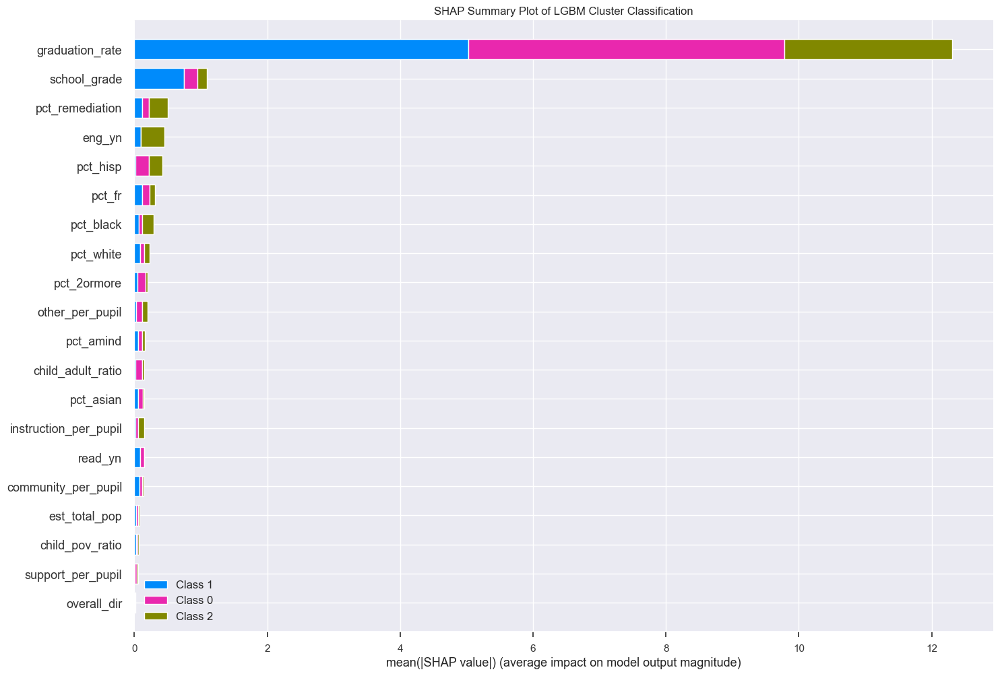

In [133]:
kpro_high_model.show_feature_importance()

The KPrototypes model seems to make a more simple classification.

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.158        39.77%                     39.77%
1              1.899        10.55%                     50.32%


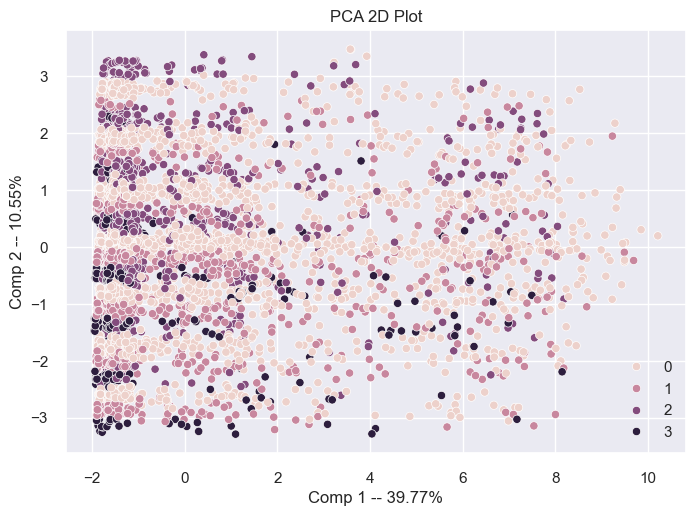

In [62]:
all_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              9.406        39.19%                     39.19%
1              2.906        12.11%                     51.30%


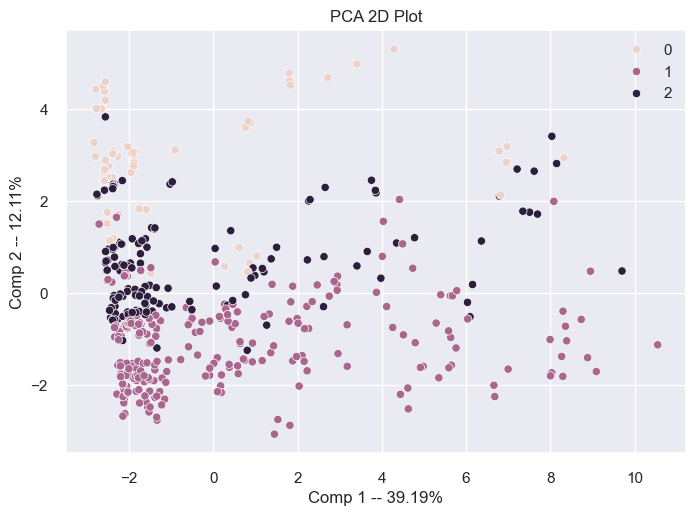

In [134]:
high_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            121.816        31.72%                     31.72%
1             31.982         8.33%                     40.05%


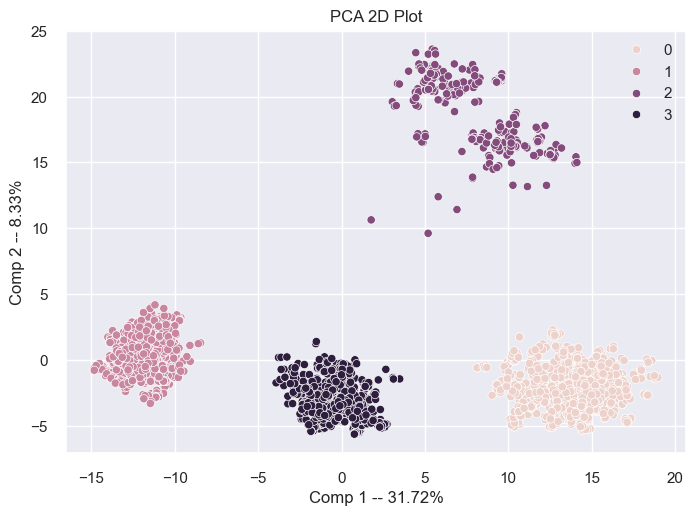

In [136]:
llm_all_model.plot_2d(save_filename='../reports/figures/llm_all_pca_2d.png')

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            127.976        33.33%                     33.33%
1             28.488         7.42%                     40.75%


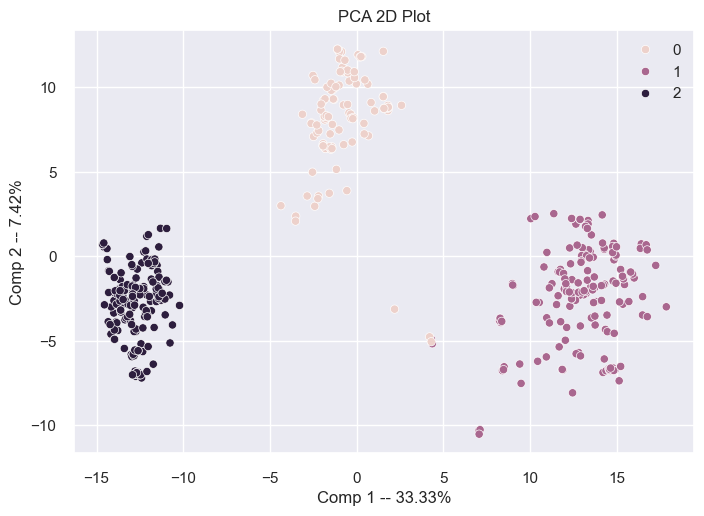

In [137]:
llm_high_model.plot_2d(save_filename='../reports/figures/llm_high_pca_2d.png')

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.163        39.80%                     39.80%
1              1.903        10.57%                     50.37%


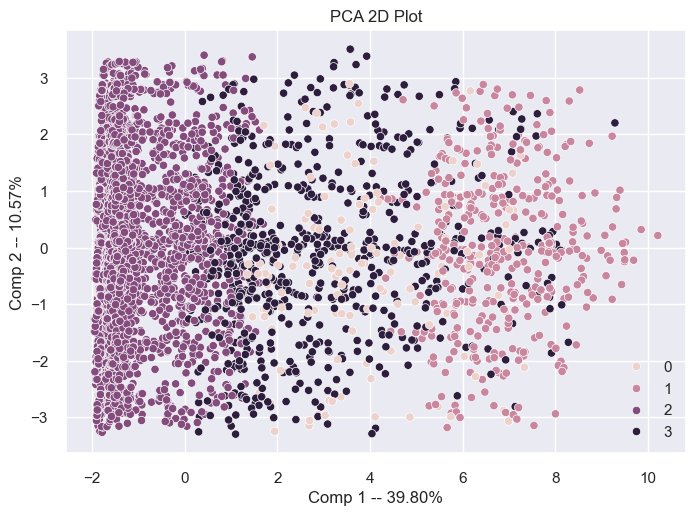

In [67]:
kpro_all_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.666        31.94%                     31.94%
1              4.127        17.19%                     49.14%


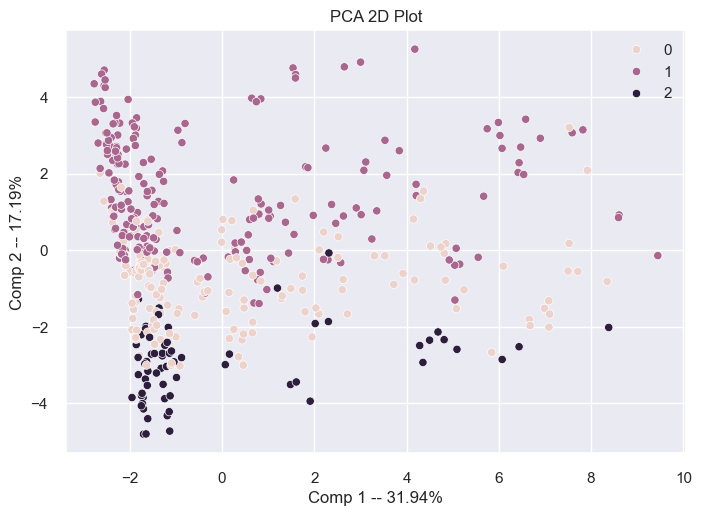

In [135]:
kpro_high_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.158        39.77%                     39.77%
1              1.899        10.55%                     50.32%
2              1.261         7.01%                     57.32%


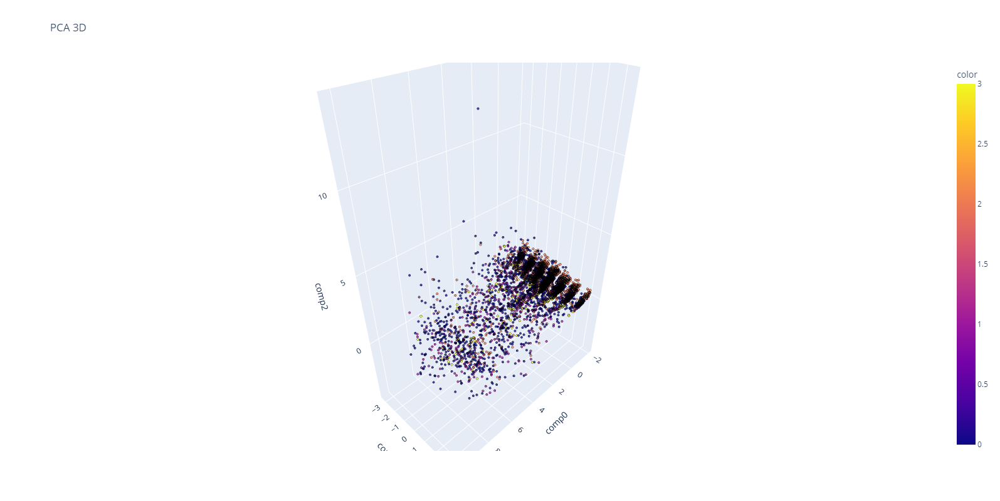

In [88]:
all_model.plot_3d()

In [138]:
high_model.plot_3d(high_school=True)

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              9.406        39.19%                     39.19%
1              2.906        12.11%                     51.30%
2              1.946         8.11%                     59.41%


In [90]:
llm_all_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            121.816        31.72%                     31.72%
1             31.982         8.33%                     40.05%
2             26.016         6.78%                     46.83%


In [91]:
llm_high_model.plot_3d(high_school=True)

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            127.976        33.33%                     33.33%
1             28.487         7.42%                     40.75%
2             22.931         5.97%                     46.72%


In [92]:
kpro_all_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.163        39.80%                     39.80%
1              1.903        10.57%                     50.37%
2              1.260         7.00%                     57.36%


In [139]:
kpro_high_model.plot_3d(high_school=True)

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.666        31.94%                     31.94%
1              4.127        17.19%                     49.14%
2              1.950         8.13%                     57.26%


## Conclusion

We have decided to use the LLM + KMeans model. While it does not produce as good of metrics as the KMeans model, its PCA space graph makes a convicing argument for its effectiveness. There are distinct clusters visible in even in 2 dimensions with only approximately 40% of the variance explained. The processing power of the Large Language Model breaks down the data into ways that the simple KMeans cannot extract. While we do acknowledge that there could be a higher performing clustering algorithm to apply to the LLM model such as DBSCAN especially since our dataset is relatively small ~400 features and ~6000 observations, we will continue using KMeans for now.

In [112]:
llm_all_model.save_model('../data/final', 'final_llm_all.csv', llm_all_no_outliers)
llm_high_model.save_model('../data/final', 'final_llm_high.csv', llm_high_no_outliers)